In [8]:
%run './model/multi_corpus.py'
%run './model/ergm_functions.py'
%run './constants.py'


import polars as pl
from netgraph import Graph, ArcDiagram
from itertools import accumulate
import operator
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from collections import defaultdict
import itertools

import seaborn as sns
from IPython.display import display, clear_output

In [2]:
corpora = co_occurence_graphs(n_edges=100)
Gs = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

Gender Studies Graph with 57 nodes and 100 edges
Geometry Graph with 61 nodes and 100 edges
Geophysics Graph with 63 nodes and 100 edges
Economics Graph with 50 nodes and 100 edges
Language & Linguistics Graph with 58 nodes and 100 edges
Probability & Statistics Graph with 58 nodes and 100 edges
Material Engineering Graph with 49 nodes and 100 edges
Artificial Intelligence Graph with 49 nodes and 100 edges
Sociology Graph with 76 nodes and 100 edges
International Business Graph with 51 nodes and 100 edges
Political Science Graph with 56 nodes and 100 edges
Genetics & Genomics Graph with 71 nodes and 100 edges
Immunology Graph with 92 nodes and 100 edges
Human Resources & Organizations Graph with 66 nodes and 100 edges
Ethnic & Cultural Studies Graph with 52 nodes and 100 edges
Neurology Graph with 46 nodes and 100 edges


In [3]:
# sample_size = 5000
# n_edges = 100

# dfs_temporal_path = './dfs_temporal'

# for field_name, df in Dfs.items():

#     print(field_name)

#     df_temporal_path = os.path.join(dfs_temporal_path, field_name)
#     if not os.path.exists(df_temporal_path):
#         os.mkdir(df_temporal_path)

#     df_edges = {}
#     for year in df['Date'].dt.year().unique().sort():
        
#         df_edge = (
#             df
#             .sample(min(df.height, sample_size))
#             .select(pl.col('Date').dt.year(), 'Text')

#             .filter(pl.col('Date').le(year))
            
#             .filter(pl.col('Text').arr.lengths().gt(1))
#             .with_columns(pl.col('Text').arr.sort())
#             .with_columns(pl.col('Text').apply(lambda a: list(combinations(a, 2))))
#         )

#         try:
#             df_edge = (
#                 df_edge
#                 .explode('Text')
#                 .with_columns(
#                     pl.col('Text').arr.first().alias('u'),
#                     pl.col('Text').arr.last().alias('v'),
#                 )
#                 .filter(pl.col('u').ne(pl.col('v')))
#                 .groupby(['u', 'v'])
#                 .agg(pl.count().alias('Count'))
#                 .filter(pl.col('Count').gt(1))
#                 .sort('Count', descending=True)
#                 .head(n_edges)
#             )
#         except:
#             print(year, df_edge)
#             break

#         df_edge.write_parquet(os.path.join(df_temporal_path, f'{year}.parquet'))

# clear_output(wait=True)

In [9]:
dfs_temporal_path = './dfs_temporal'

dfs_temporal = defaultdict(dict)

for field_name in os.listdir(dfs_temporal_path):

    dfs_year_path = os.path.join(dfs_temporal_path, field_name)
    for df_year_path in os.listdir(dfs_year_path):

        year = df_year_path.split('.')[0]
        df_year = pl.read_parquet(os.path.join(dfs_temporal_path, field_name, df_year_path))

        dfs_temporal[field_name][int(year)] = df_year

# Global Measurements

In [8]:
def nodes(G):
    return len(G.nodes)

def diameter(G):
    return nx.diameter(G)

def density(G):
    return nx.density(G)

def shortest_path(G):
    return nx.average_shortest_path_length(G)

def transitivity(G):
    return nx.transitivity(G)

def centralization(G):
    # degree_centralities = nx.degree_centrality(G).values()
    degree_centralities = nx.betweenness_centrality(G).values()
    C_max = max(degree_centralities)
    n = G.number_of_nodes()
    centralization = sum(C_max - C for C in degree_centralities) / ((n-1) * (n-2))
    return min(1., centralization)

def community(G):
    return len(nx_comm.louvain_communities(G))

def clustering(G):
    return nx.average_clustering(G)

measures = [nodes, density, transitivity, centralization, community, clustering] # transitivity, centralization, community, clustering, diameter, shortest_path


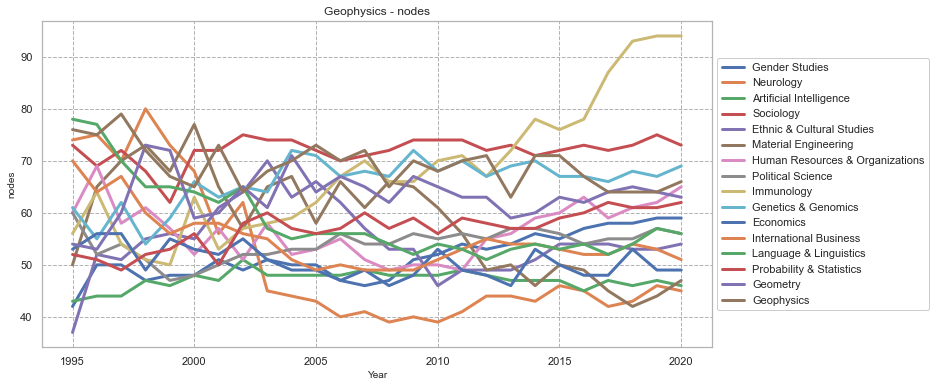

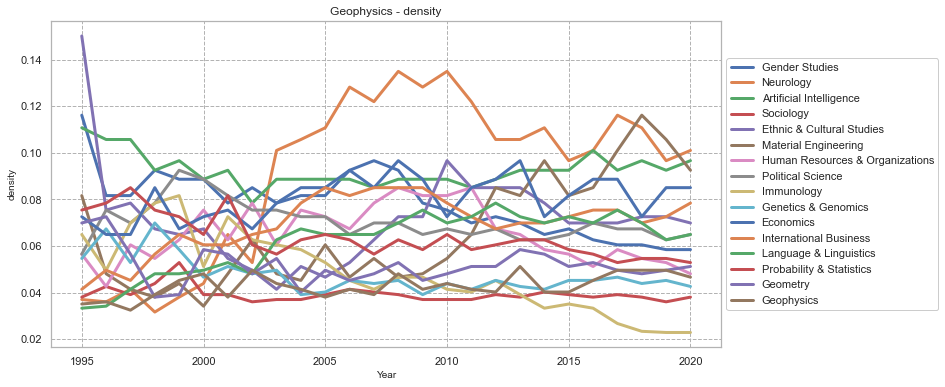

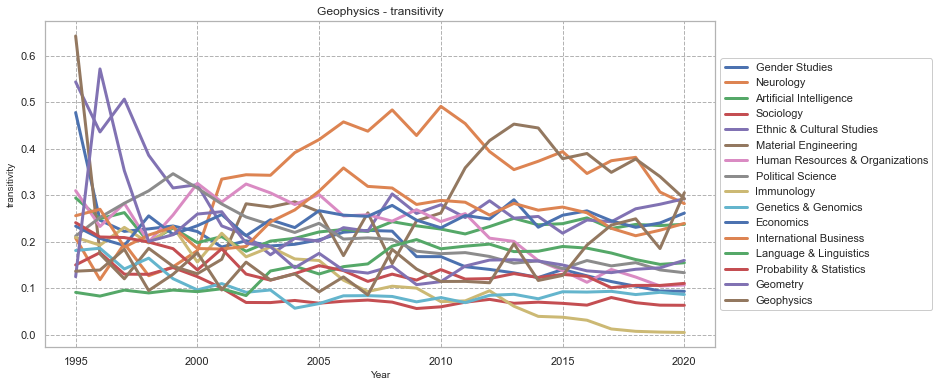

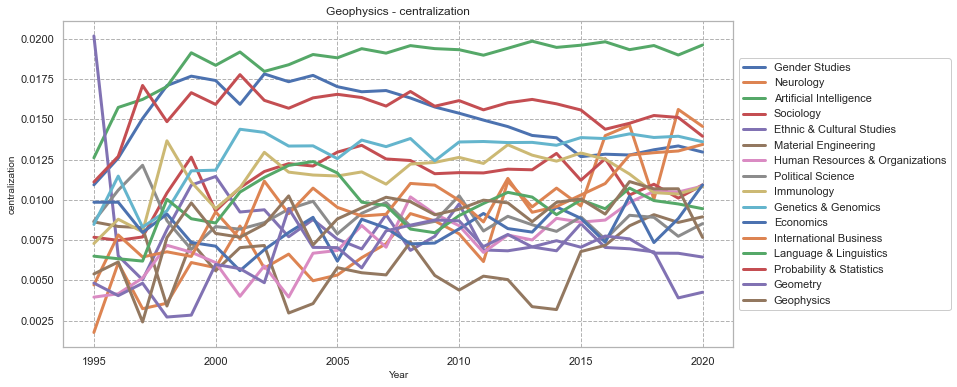

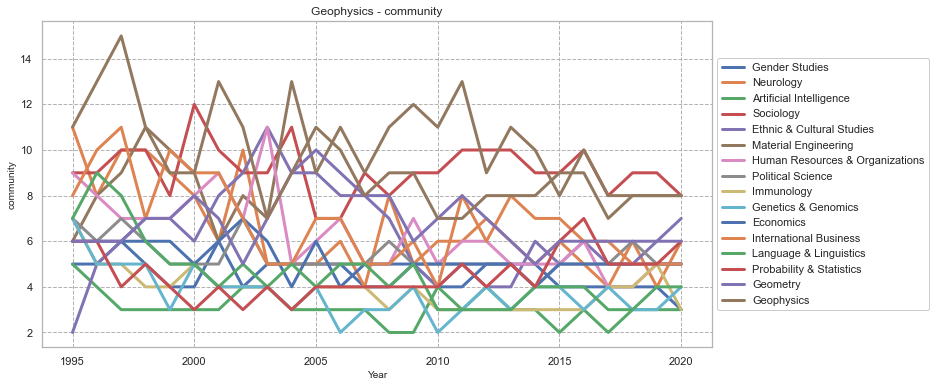

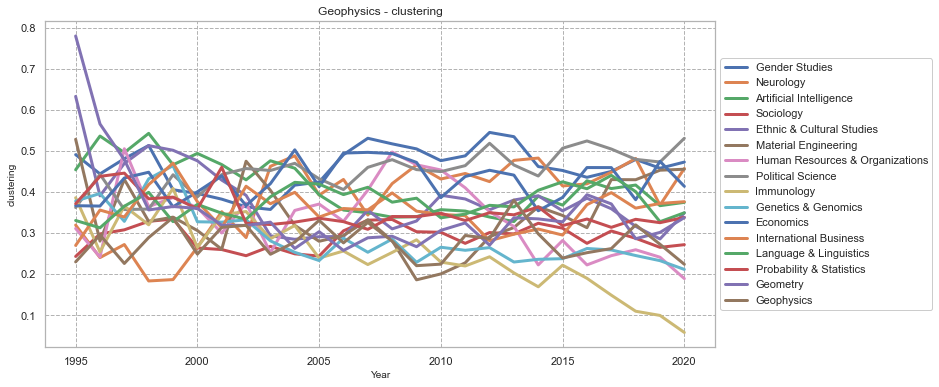

In [10]:
measurements = {}
for measure in measures:

    all_data = pl.DataFrame()

    for field_name, dfs in dfs_temporal.items():

        m = defaultdict(list)
        for year, df in sorted(dfs.items(), key=lambda tup: tup[0]):

            G = nx.Graph()
            G.add_weighted_edges_from(df.rows())

            m['Date'].append(year)
            m[field_name].append(measure(G))

        df = pl.DataFrame(m)

        if all_data.is_empty():
            all_data = df
        else:
            all_data = all_data.join(df, on='Date', how='left')

    all_data = all_data.filter(pl.col('Date').ge(1995))

    x = all_data['Date']
    ys = all_data.select(pl.all().exclude('Date'))

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
    trace = ax.plot(x, ys, linewidth=3)

    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel(f'{measure.__name__}', fontsize=10)
    ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
    ax.grid(True, which="both", ls="--", c='0.7')

    ax.set_facecolor('white')
    ax.spines['bottom'].set_color('0.7')
    ax.spines['top'].set_color('0.7')
    ax.spines['right'].set_color('0.7')
    ax.spines['left'].set_color('0.7')

    ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

    measurements[measure.__name__] = all_data


# Temporal Graphs

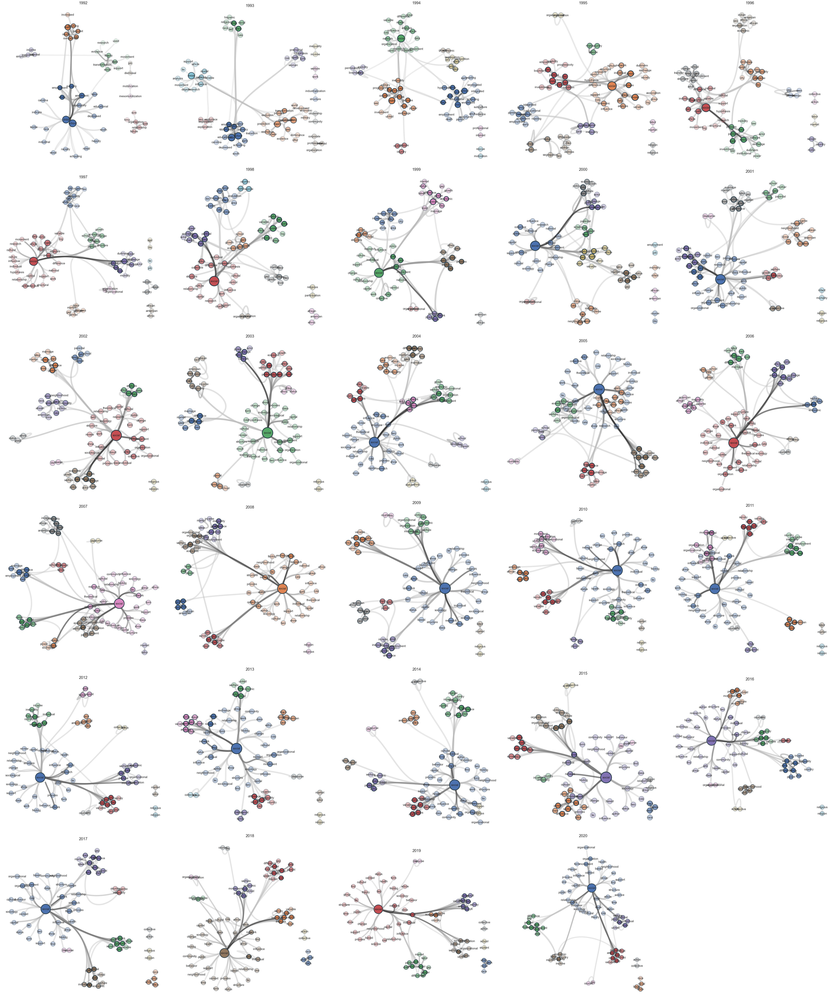

In [7]:
field_name = 'Sociology'
dfs = dfs_temporal[field_name]

num_years = len(dfs)
rows = int(np.ceil(np.sqrt(num_years)))
cols = int(np.ceil(num_years / rows))

fig, axes = plt.subplots(rows, cols, figsize=(12 * cols, 12 * rows))

if rows > 1 and cols > 1:
    axes = axes.ravel()
else:
    axes = [axes]

for idx, (year, df) in enumerate(sorted(dfs.items(), key=lambda tup: tup[0])):

    print(year), clear_output(wait=True)

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())

    communities = nx_comm.louvain_communities(G)
    num_comms = len(communities)
    communities = {node: i for i, comm in enumerate(communities) for node in comm}

    node_size = dict(nx.degree(G))
    node_size = {node: max(2, np.log(size)) for node, size in node_size.items()}

    comm_color = sns.color_palette(n_colors=num_comms)
    node_color = {node: comm_color[i] for node, i in communities.items()}

    node_alpha = nx.core_number(G)
    max_core = max(node_alpha.values())
    node_alpha = {n: core / max_core for n, core in node_alpha.items()}

    node_labels = dict(zip(G.nodes, G.nodes))

    ax = axes[idx]

    Graph(
        G,
        edge_layout='bundled',
        node_layout='community',
        node_size=node_size,
        node_color=node_color,
        node_labels=True,
        node_label_fontdict={'size': 15},
        node_label_offset=0.00,
        node_alpha=node_alpha,
        ax=ax,
        node_layout_kwargs=dict(node_to_community=communities)
    )

    ax.patch.set_alpha(0)
    ax.set_title(f'{year}', fontsize=20)

for i in range(num_years, rows * cols):
    axes[i].axis('off')

# fig.suptitle(f'Temporal {field_name}', fontsize=20)

plt.tight_layout()
fig.savefig(f'./latex/figures/co_occurrence_temporal_graphs/{field_name}.png', dpi=300, transparent=True)

plt.show()

# Temporal Dendrograms

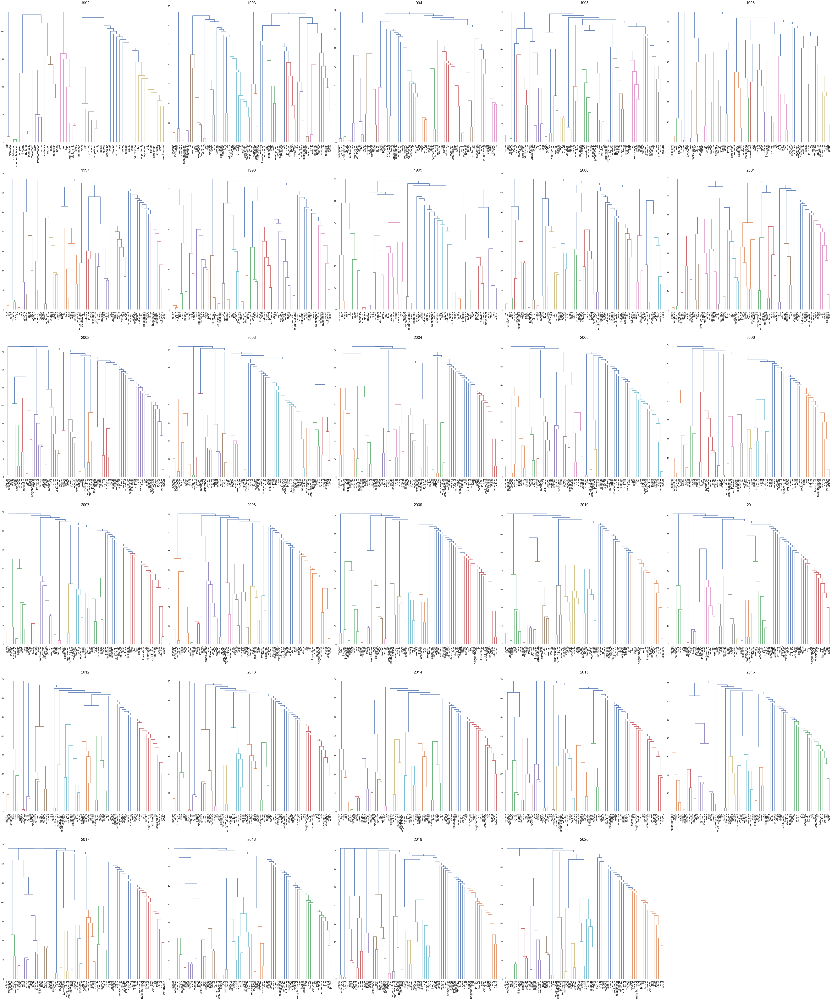

In [8]:
import scipy
import itertools

field_name = 'Sociology'
dfs = dfs_temporal[field_name]

method = 'grivan_newman' # louvain, girvan_newman

num_years = len(dfs)
rows = int(np.ceil(np.sqrt(num_years)))
cols = int(np.ceil(num_years / rows))

fig, axes = plt.subplots(rows, cols, figsize=(12 * cols, 12 * rows))

if rows > 1 and cols > 1:
    axes = axes.ravel()
else:
    axes = [axes]

for idx, (year, df) in enumerate(sorted(dfs.items(), key=lambda tup: tup[0])):

    print(year), clear_output(wait=True)

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())

    communities = nx_comm.louvain_communities(G)
    num_comms = len(communities)
    communities = {node: i for i, comm in enumerate(communities) for node in comm}

    node_size = dict(nx.degree(G))
    node_size = {node: max(2, np.log(size)) for node, size in node_size.items()}

    comm_color = sns.color_palette(n_colors=num_comms)
    node_color = {node: comm_color[i] for node, i in communities.items()}

    node_alpha = nx.core_number(G)
    max_core = max(node_alpha.values())
    node_alpha = {n: core / max_core for n, core in node_alpha.items()}

    node_labels = dict(zip(G.nodes, G.nodes))

    if method == 'louvain':
        hier_comms = list(nx.community.louvain_partitions(G, weight='weight', resolution=1, threshold=1e-07, seed=None))
        hier_comms.append([{node} for community in hier_comms[-1] for node in community])
    if method == 'grivan_newman':
        hier_comms = list(nx.community.girvan_newman(G))

    nodes = set.union(*hier_comms[-1])
    ids = dict(zip(nodes, range(len(nodes))))

    M_dst = np.full((len(nodes), len(nodes)), len(hier_comms))

    dsts = []
    modularities = []
    for i, level in enumerate(hier_comms):
        modularity = nx.community.modularity(G, level, weight='weight', resolution=1)
        modularities.append(modularity)
        dst = len(hier_comms) - i - 1
        for cluster in level:
            for u, v in itertools.combinations(cluster, 2):
                M_dst[ids[u]][ids[v]] = dst
                M_dst[ids[v]][ids[u]] = dst
        dsts.append(dst)

    np.fill_diagonal(M_dst, 0)
    A_dst = scipy.spatial.distance.squareform(M_dst)
    M_linkage = scipy.cluster.hierarchy.linkage(A_dst)

    ax = axes[idx]

    scipy.cluster.hierarchy.dendrogram(M_linkage, labels=list(ids.keys()), leaf_rotation=90., leaf_font_size=15, ax=ax)

    ax.patch.set_alpha(0)
    ax.set_title(f'{year}', fontsize=20)

for i in range(num_years, rows * cols):
    axes[i].axis('off')

# fig.suptitle(f'Temporal {field_name}', fontsize=20)

plt.tight_layout()
fig.savefig(f'./latex/figures/co_occurrence_temporal_dendros/{field_name}.png', dpi=300, transparent=True)

plt.show()

# Temporal Communities

In [391]:
field_name = 'Sociology'
dfs = dfs_temporal[field_name]

Gs_temporal = {}
for year, df in dfs.items():

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())

    Gs_temporal[year] = G

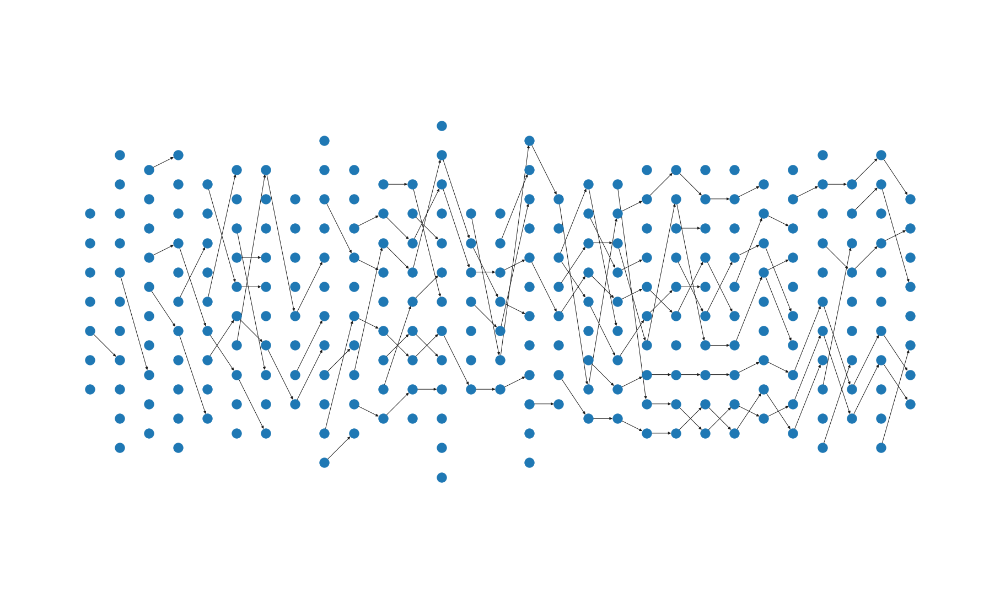

In [412]:
import itertools

def jaccard(c1, c2):
    intersection = set(c1).intersection(set(c1))
    union = c1.union(c2)
    jaccard = len(intersection) / len(union)
    return jaccard

threshold = 1

tree = nx.DiGraph()

for t in sorted(Gs_temporal.keys())[:-1]:

    G_t = Gs_temporal[t]
    G_t1 = Gs_temporal[t+1]

    comms_t = nx_comm.louvain_communities(G_t)
    comms_t1 = nx_comm.louvain_communities(G_t1)

    coreness_t = nx.core_number(G_t)
    coreness_t1 = nx.core_number(G_t1)

    for comm_t, comm_t1 in itertools.product(comms_t, comms_t1):

        coreness_comm_t = filter(lambda tup: tup[0] in comm_t, coreness_t.items())
        sorted_coreness_comm_t = sorted(coreness_comm_t, key=lambda tup: tup[1], reverse=True)
        top_coreness_comm_t = [term for term, _ in sorted_coreness_comm_t[:3]]
        node_t = '\n'.join(top_coreness_comm_t)
        
        coreness_comm_t1 = filter(lambda tup: tup[0] in comm_t1, coreness_t1.items())
        sorted_coreness_comm_t1 = sorted(coreness_comm_t1, key=lambda tup: tup[1], reverse=True)
        top_coreness_comm_t1 = [term for term, _ in sorted_coreness_comm_t1[:3]]
        node_t1 = '\n'.join(top_coreness_comm_t1)

        node_t = f'{t}-{node_t}'
        node_t1 = f'{t+1}-{node_t1}'

        # node_t = (t, node_t)
        # node_t1 = (t+1, node_t1)

        t_min = min(Gs_temporal.keys())
        if node_t not in tree:
            tree.add_node(node_t, layer=t-t_min, date=t)
        if node_t1 not in tree:
            tree.add_node(node_t1, layer=t+1-t_min, date=t+1)

        similarity = jaccard(comm_t, comm_t1)
    
        if similarity >= threshold:
            tree.add_edge(node_t, node_t1, similarity=similarity)

pos = nx.multipartite_layout(tree, subset_key="layer")

plt.figure(figsize=(25, 15))
nx.draw(tree, pos, with_labels=False)
plt.axis("equal")
plt.show()

In [438]:
layers = defaultdict(list)
for node, d in tree.nodes(data=True):
    layers[d['layer']].append(node)
layers = list(layers.values())

In [439]:
import math

def distance(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

In [452]:
for t in range(len(layers)-1):
    for parent in layers[t]:

        children = list(tree.neighbors(parent))
        children_pos = [(child, pos[child]) for child in children]

        layer_t1 = [(node, pos[node]) for node in layers[t+1]]
        new_children_pos = sorted(layer_t1, key=lambda tup: distance(pos[parent], tup[1]))
        new_children_pos = new_children_pos[:len(children)]

        for (child, child_pos), (new_child, new_child_pos) in zip(children_pos, new_children_pos):
            pos[child], pos[new_child] = pos[new_child], pos[child]


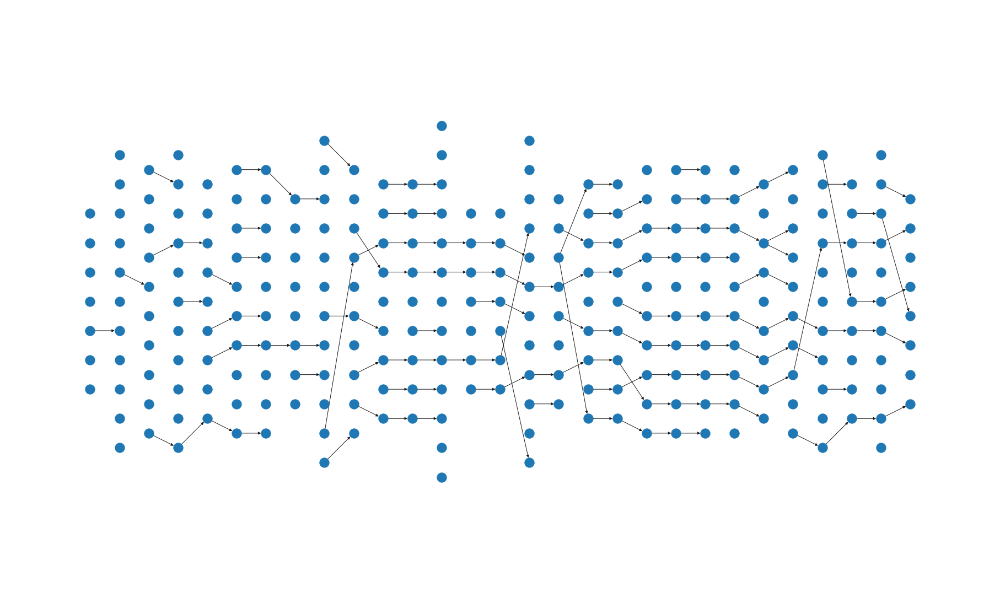

In [453]:
plt.figure(figsize=(25, 15))
nx.draw(tree, pos, with_labels=False)
plt.axis("equal")
plt.show()

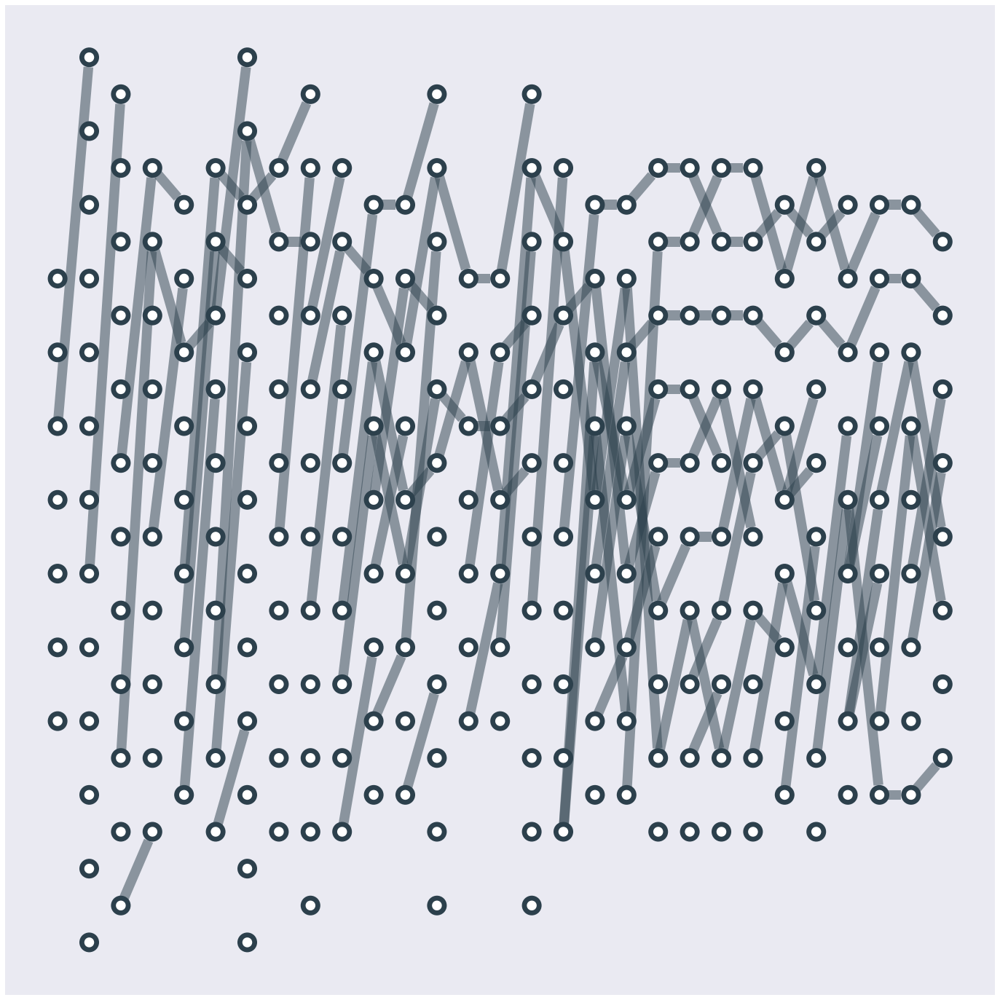

In [409]:
layers = defaultdict(list)
for node, d in tree.nodes(data=True):
    layers[d['layer']].append(node)
layers = list(layers.values())

fig, ax = plt.subplots(figsize=(25,25))

Graph(
    tree,
    # edge_layout='bundled',
    node_layout='multipartite',
    node_size=1,
    # node_color=node_color,
    # node_labels=True,
    # node_label_fontdict={'size': 15},
    # node_label_offset=0.00,
    # node_alpha=node_alpha,
    ax=ax,
    node_layout_kwargs=dict(layers=layers)
)

plt.show()

# Final Communities

In [23]:
field_name = 'Sociology'
dfs = dfs_temporal[field_name]
df = dfs[2020]

G = nx.Graph()
G.add_weighted_edges_from(df.rows())

list_communities = nx_comm.louvain_communities(G)
dict_communities = {node: i for i, community in enumerate(list_communities) for node in community}

# Local Measurements

In [95]:
def centrality(G):
    return nx.betweenness_centrality(G)

def coreness(G):
    return nx.core_number(G)

measures = [centrality, coreness]

In [1]:



for measure in measures:

    vals = []
    for year, df in dfs.items():

        G = nx.Graph()
        G.add_weighted_edges_from(df.rows())

        vals.append(measure(G))
        
    df = pl.DataFrame(vals)

    x = list(dfs.keys())
    ys = df
    
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
    trace = ax.plot(x, ys, linewidth=3)

    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel(f'{measure.__name__}', fontsize=10)
    ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
    ax.grid(True, which="both", ls="--", c='0.7')

    ax.set_facecolor('white')
    ax.spines['bottom'].set_color('0.7')
    ax.spines['top'].set_color('0.7')
    ax.spines['right'].set_color('0.7')
    ax.spines['left'].set_color('0.7')

    ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

In [119]:
df_measurement = []

for year, df in dfs.items():

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())
    measure = nx.betweenness_centrality(G)

    communities = nx_comm.louvain_communities(G)

    measurement = {}

    for community in communities:
        
        community_measure = np.mean([measure[node] for node in community])

        G_sub = G.subgraph(community)
        centralities = nx.betweenness_centrality(G_sub)
        community_name = sorted(centralities.items(), key=lambda d: d[1], reverse=True)
        community_name = ' '.join([name[0] for name in community_name[:2]])

        measurement[community_name] = community_measure

    df_measurement.append(measurement) 

In [121]:
df = pl.DataFrame(df_measurement)

In [40]:
x = range(1992, 2021)
ys = df

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
trace = ax.plot(x, ys, linewidth=3)

ax.set_xlabel('Year', fontsize=10)
# ax.set_ylabel(f'{measure.__name__}', fontsize=10)
# ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
ax.grid(True, which="both", ls="--", c='0.7')

ax.set_facecolor('white')
ax.spines['bottom'].set_color('0.7')
ax.spines['top'].set_color('0.7')
ax.spines['right'].set_color('0.7')
ax.spines['left'].set_color('0.7')

ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [141]:
field_name = 'Sociology'
dfs = df_temporal[field_name]
df = dfs[2020]
G_full = nx.Graph()
G_full.add_weighted_edges_from(df.rows())

communities = nx_comm.louvain_communities(G_full)
communities = {node: i for i, community in enumerate(communities) for node in community}

In [154]:
df_measurement = []
years = []
for year, df in dfs.items():

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())
    measure = nx.betweenness_centrality(G)

    

    measurement = defaultdict(list)

    for node, score in measure.items():
        try:
            node_community = communities[node]
            measurement[node_community].append(score)
        except:
            continue
        
    measurement = {str(community): np.mean(measures) for community, measures in measurement.items()}
    
    df_measurement.append(measurement)
    years.append(year)

df = pl.DataFrame(df_measurement)

    

In [39]:
x = years
ys = df

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
trace = ax.plot(x, ys, linewidth=3)

ax.set_xlabel('Year', fontsize=10)
# ax.set_ylabel(f'{measure.__name__}', fontsize=10)
# ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
ax.grid(True, which="both", ls="--", c='0.7')

ax.set_facecolor('white')
ax.spines['bottom'].set_color('0.7')
ax.spines['top'].set_color('0.7')
ax.spines['right'].set_color('0.7')
ax.spines['left'].set_color('0.7')

ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [240]:
field_name = 'Sociology'
dfs = dfs_temporal[field_name]

In [241]:
Gs = []
for year, df in dfs.items():
    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())

    Gs.append(G)

G_composed = nx.Graph()
for G in Gs:
    G_composed = nx.compose(G_composed, G)

nodes = list(G_composed.nodes())
nodes[:5]

['child', 'school', 'enrollment', 'evidence', 'theory']

In [242]:
df_measurement = []
years = []
for year, df in dfs.items():
    if year < 1995:
        continue
    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())
    measure = nx.betweenness_centrality(G)
    all_nodes = dict.fromkeys(nodes)
    all_nodes.update(measure)
    df_measurement.append(all_nodes)
    years.append(year)

df = pl.DataFrame(df_measurement)
df.head()

child,school,enrollment,evidence,theory,black,industry,white,employment,rate,county,populist,organization,relationship,state,transformation,lynching,opportunity,depressed,labor,social,competition,type,income,inequality,dismissal,job,movement,size,failure,increased,hmo,national,schooling,indicate,south,carolina,...,area,capital,population,participation,level,policy,marriage,status,neighborhood,parental,public,course,sociology,infant,mortality,result,two,marital,mother,form,show,theoretical,sociological,review,finding,identity,author,survey,based,behavior,health,find,context,one,time,science,student
f64,f64,f64,bool,f64,f64,bool,f64,f64,f64,bool,bool,f64,f64,f64,bool,bool,bool,bool,f64,f64,bool,bool,f64,f64,bool,f64,f64,bool,bool,bool,bool,f64,bool,bool,bool,bool,...,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
0.093798,0.112793,0.0,null,0.082186,0.037082,null,0.026213,0.0,0.10423,null,null,0.026213,null,0.100207,null,null,null,null,0.0,0.572953,null,null,0.039031,0.075132,null,null,null,null,null,null,null,null,null,null,null,null,...,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0.000452,0.0,null,null,0.101278,0.27898,null,0.010244,null,0.056581,null,null,null,null,0.072512,null,null,null,null,0.0,0.514819,null,null,0.028168,0.003701,null,null,0.0,null,null,null,null,0.0,null,null,null,null,...,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0.044212,0.0,null,null,0.076016,0.078283,null,0.000939,null,0.114554,null,null,0.047887,0.0,0.004883,null,null,null,null,0.024145,0.552515,null,null,0.042643,0.003957,null,0.0,0.0,null,null,null,null,0.0,null,null,null,null,...,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0.032301,0.0,null,null,0.059701,0.158375,null,0.000528,null,0.109227,null,null,0.027589,0.0,0.00294,null,null,null,null,0.027589,0.701794,null,null,0.033205,0.003015,null,null,0.0,null,null,null,null,null,null,null,null,null,...,0.0,0.0,0.0,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0.034381,0.0,null,null,0.0501,0.128142,null,0.000956,null,0.056922,null,null,0.031694,0.0,0.036311,null,null,null,null,0.031694,0.771985,null,null,0.000546,0.012204,null,null,0.0,null,null,null,null,0.0,null,null,null,null,...,0.0,0.0,null,null,0.0,0.0,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


In [243]:
df_gt = (
    pl.concat([
        df
        .select(
            pl.all().mean(),
        ),
        df
        .select(
            pl.all().var(),
        )
    ])
    .transpose(column_names=['Mean', 'Var'], include_header=True, header_name='Term')
    .filter(
        pl.col('Mean').ge(pl.col('Mean').median()) | pl.col('Var').ge(pl.col('Mean').var())
    )
)

nodes = df_gt['Term'].to_list()

# nodes.remove('social')
nodes[:3]

['child', 'school', 'theory']

In [4]:
temporal_communities = []
years = []
for year, df in dfs.items():
    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())
    communities = nx_comm.louvain_communities(G)

    temporal_communities.append(communities)
    years.append(year)

temporal_communities[0]

In [ ]:
same(['competition', 'ethnic', 'labor', 'market', 'segregation', 'sex'], ['labor', 'market'])

In [3]:
import itertools

def same(community_1, community_2, jaccard_threshold=0.9):
    community_1 = set(community_1)
    community_2 = set(community_2)
    intersection = community_1.intersection(community_1)
    union = community_1.union(community_2)
    jaccard = len(intersection) / len(union)
    return jaccard > jaccard_threshold


for t in range(len(temporal_communities)-1):
    
    communities_t = temporal_communities[t]
    year_t = years[t]

    print(year_t)
    
    communities_t1 = temporal_communities[t+1]
    year_t1 = years[t+1]

    community_ids = {frozenset(com): i for i, com in enumerate(temporal_communities[0])}

    for community_t in communities_t:
        for community_t1 in communities_t1:
            if same(community_t, community_t1):

                print(sorted(community_t))
                print(sorted(community_t1))
                print()

In [239]:
x = years
ys = df[nodes]

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
trace = ax.plot(x, ys, linewidth=3)

ax.set_xlabel('Year', fontsize=10)
# ax.set_ylabel(f'{measure.__name__}', fontsize=10)
# ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
ax.grid(True, which="both", ls="--", c='0.7')

ax.set_facecolor('white')
ax.spines['bottom'].set_color('0.7')
ax.spines['top'].set_color('0.7')
ax.spines['right'].set_color('0.7')
ax.spines['left'].set_color('0.7')

# ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
